# Importing Libraries

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [7]:
matplotlib.__version__

'3.5.2'

In [8]:

%matplotlib inline

In [9]:
df = pd.read_excel('/Users/Mimi/Downloads/Achievement 6 /Data/housing_6.1.xlsx', index_col = False)

# 2. Data Cleaning

Renaming and Organizing Columns

In [10]:
df.shape

(6075, 42)

In [11]:
df.columns

Index(['Unnamed: 0', 'Project ID', 'Project Name', 'Project Start Date',
       'Project Completion Date', 'Building ID', 'Number', 'Street', 'Borough',
       'Postcode', 'BBL', 'BIN', 'Community Board', 'Council District',
       'Census Tract', 'NTA - Neighborhood Tabulation Area', 'Latitude',
       'Longitude', 'Latitude (Internal)', 'Longitude (Internal)',
       'Building Completion Date', 'Reporting Construction Type',
       'Extended Affordability Only', 'Prevailing Wage Status',
       'Extremely Low Income Units', 'Very Low Income Units',
       'Low Income Units', 'Moderate Income Units', 'Middle Income Units',
       'Other Income Units', 'Studio Units', '1-BR Units', '2-BR Units',
       '3-BR Units', '4-BR Units', '5-BR Units', '6-BR+ Units',
       'Unknown-BR Units', 'Counted Rental Units',
       'Counted Homeownership Units', 'All Counted Units', 'Total Units'],
      dtype='object')

In [12]:
# Rename columns whose names are too long

df.rename(columns = {'Project Completion Date' : 'Project End Date', 'NTA - Neighborhood Tabulation Area': 'NTA', 
                     'Building Completion Date': 'Building End Date'},
                      inplace = True)

In [13]:
df.dtypes

Unnamed: 0                              int64
Project ID                              int64
Project Name                           object
Project Start Date             datetime64[ns]
Project End Date               datetime64[ns]
Building ID                           float64
Number                                 object
Street                                 object
Borough                                object
Postcode                              float64
BBL                                   float64
BIN                                   float64
Community Board                         int64
Council District                      float64
Census Tract                          float64
NTA                                    object
Latitude                              float64
Longitude                             float64
Latitude (Internal)                   float64
Longitude (Internal)                  float64
Building End Date              datetime64[ns]
Reporting Construction Type       

In [14]:
df.head()

,Unnamed: 0,Project ID,Project Name,Project Start Date,Project End Date,Building ID,Number,Street,Borough,Postcode,...,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,0,72920,CONFIDENTIAL,2022-09-30,2022-09-30,NaN,----,----,Staten Island,NaN,...,0,1,0,0,0,0,0,1,1,1
1,1,72941,CONFIDENTIAL,2022-09-30,2022-09-30,NaN,----,----,Brooklyn,NaN,...,1,0,0,0,0,0,0,1,1,1
2,2,70648,3300 PALMER AVE.HPO.FY23,2022-09-29,2022-09-29,832306.0,3300,PALMER AVENUE,Bronx,10475.0,...,83,45,0,0,0,0,135,0,135,135
3,3,72917,CONFIDENTIAL,2022-09-23,2022-09-23,NaN,----,----,Staten Island,NaN,...,0,1,0,0,0,0,0,1,1,1
4,4,72918,CONFIDENTIAL,2022-09-23,2022-09-23,NaN,----,----,Brooklyn,NaN,...,0,1,0,0,0,0,0,1,1,1


In [15]:
#dropping unneeded columns

df = df.drop(columns=['Unnamed: 0', 'Latitude', 'Longitude'])

In [16]:
df.dtypes

Project ID                              int64
Project Name                           object
Project Start Date             datetime64[ns]
Project End Date               datetime64[ns]
Building ID                           float64
Number                                 object
Street                                 object
Borough                                object
Postcode                              float64
BBL                                   float64
BIN                                   float64
Community Board                         int64
Council District                      float64
Census Tract                          float64
NTA                                    object
Latitude (Internal)                   float64
Longitude (Internal)                  float64
Building End Date              datetime64[ns]
Reporting Construction Type            object
Extended Affordability Only            object
Prevailing Wage Status                 object
Extremely Low Income Units        

Missing Values Check

In [17]:
# Check for missing values

df.isnull().sum() 

Project ID                        0
Project Name                      0
Project Start Date                0
Project End Date               1904
Building ID                    1257
Number                            0
Street                            0
Borough                           0
Postcode                       1303
BBL                            1364
BIN                            1364
Community Board                   0
Council District                 92
Census Tract                   1303
NTA                            1296
Latitude (Internal)            1371
Longitude (Internal)           1371
Building End Date              1702
Reporting Construction Type       0
Extended Affordability Only       0
Prevailing Wage Status            0
Extremely Low Income Units        0
Very Low Income Units             0
Low Income Units                  0
Moderate Income Units             0
Middle Income Units               0
Other Income Units                0
Studio Units                

Duplicates Check

In [18]:
df_dups = df[df.duplicated()]

In [19]:
df_dups.shape

(0, 39)

# 3. Creating Data Subset for Vizualization

In [20]:
df_subset = df[["Borough","Extended Affordability Only","Extremely Low Income Units","Very Low Income Units","Low Income Units","Moderate Income Units","Middle Income Units","Studio Units","1-BR Units","2-BR Units","3-BR Units","4-BR Units","5-BR Units","6-BR+ Units","Total Units"]]

In [21]:
df_subset

,Borough,Extended Affordability Only,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Total Units
0,Staten Island,No,0,0,1,0,0,0,0,0,1,0,0,0,1
1,Brooklyn,No,0,0,1,0,0,0,0,1,0,0,0,0,1
2,Bronx,No,0,0,46,74,14,0,7,83,45,0,0,0,135
3,Staten Island,No,0,0,1,0,0,0,0,0,1,0,0,0,1
4,Brooklyn,No,0,0,1,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,Brooklyn,No,0,0,0,0,1,0,0,0,0,0,0,0,1
6071,Staten Island,No,0,0,0,0,1,0,0,0,0,0,0,0,1
6072,Staten Island,No,0,0,1,0,0,0,0,0,0,0,0,0,1
6073,Brooklyn,No,0,0,0,0,1,0,0,0,0,0,0,0,1


# 3. Creating Correlations

In [22]:
# Create a correlation matrix using pandas

df_subset.corr()

,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Total Units
Extremely Low Income Units,1.000000,0.070760,0.104918,0.064805,-0.023598,0.465986,0.374118,0.208193,0.183016,0.087292,-0.015248,0.031663,0.286701
Very Low Income Units,0.070760,1.000000,0.242273,0.024363,-0.020975,0.149153,0.561191,0.693899,0.678082,0.078196,-0.011174,-0.002439,0.473495
Low Income Units,0.104918,0.242273,1.000000,0.163924,0.016896,0.432231,0.609291,0.594037,0.490310,0.182825,0.061868,-0.006042,0.595623
Moderate Income Units,0.064805,0.024363,0.163924,1.000000,0.073248,0.333704,0.341556,0.254680,0.126788,0.037122,-0.006533,-0.001892,0.295794
Middle Income Units,-0.023598,-0.020975,0.016896,0.073248,1.000000,0.127617,0.281072,0.238740,0.073106,-0.015013,-0.008783,-0.004095,0.347529
Studio Units,0.465986,0.149153,0.432231,0.333704,0.127617,1.000000,0.395221,0.233372,0.108978,0.004361,-0.003583,-0.006648,0.492934
1-BR Units,0.374118,0.561191,0.609291,0.341556,0.281072,0.395221,1.000000,0.677559,0.557530,0.076620,-0.000878,-0.011086,0.742080
2-BR Units,0.208193,0.693899,0.594037,0.254680,0.238740,0.233372,0.677559,1.000000,0.683063,0.142258,0.011231,-0.010945,0.654149
3-BR Units,0.183016,0.678082,0.490310,0.126788,0.073106,0.108978,0.557530,0.683063,1.000000,0.267638,0.040915,0.054387,0.493266
4-BR Units,0.087292,0.078196,0.182825,0.037122,-0.015013,0.004361,0.076620,0.142258,0.267638,1.000000,0.097753,-0.003380,0.106097


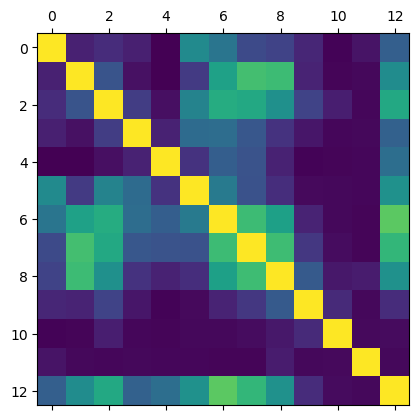

In [23]:
# Create a correlation heatmap using matplotlib

plt.matshow(df_subset.corr())
plt.show()

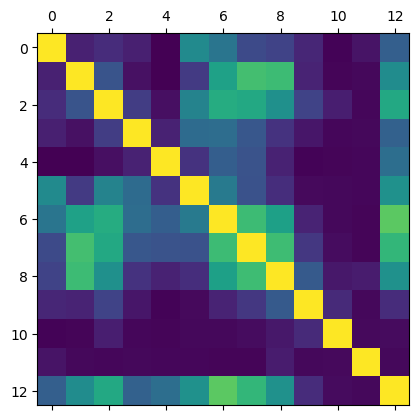

In [35]:
# Save figure
plt.matshow(df_subset.corr())
plt.savefig("out.png") 


In [24]:
#current dir
cwd = os.getcwd()
cwd

'/Users/Mimi'

Text(0.5, 1.0, 'Correlation Matrix')

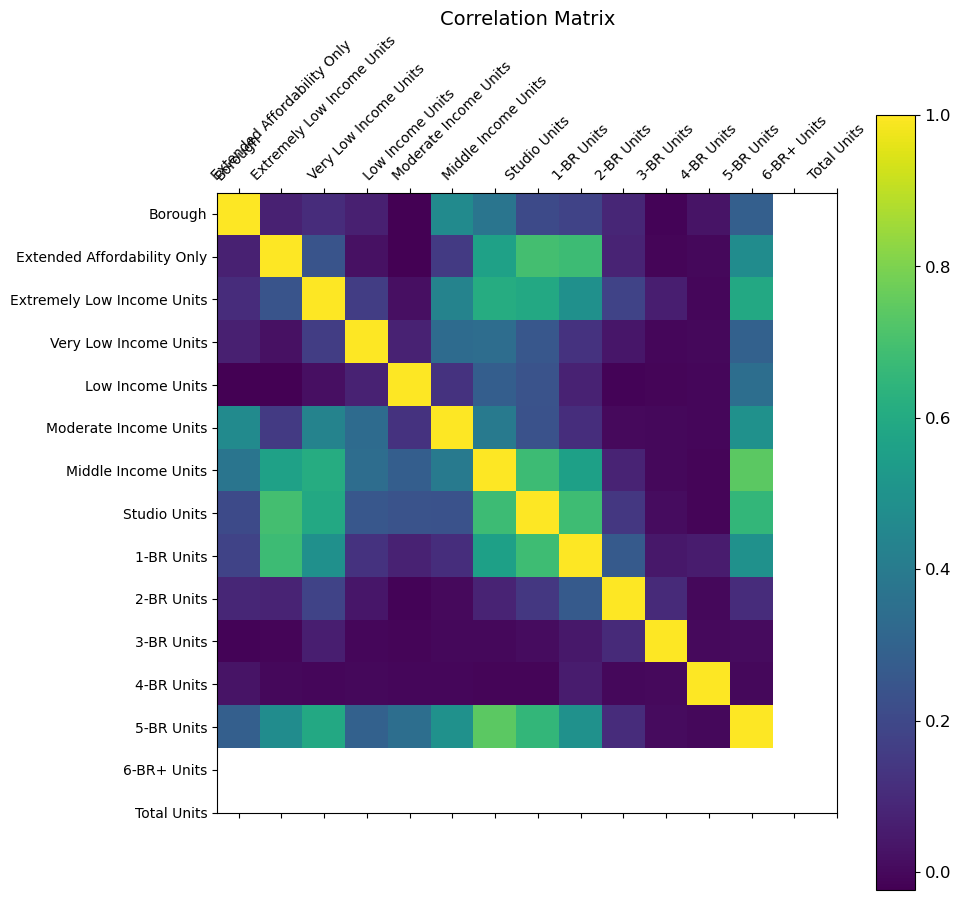

In [41]:
# Add labels, a legend, and change the size of the heatmap

f = plt.figure(figsize=(10, 10)) # figure size 
plt.matshow(df_subset.corr(), fignum=f.number) # type of plot
plt.xticks(range(df_subset.shape[1]), df_subset.columns, fontsize=10, rotation=45) # x axis labels
plt.yticks(range(df_subset.shape[1]), df_subset.columns, fontsize=10) # y axis labels
cb = plt.colorbar() # add a colour legend (called colorbar)
cb.ax.tick_params(labelsize=12) # add font size
plt.title('Correlation Matrix', fontsize=14) # add title

In [25]:
# Correlation in Seaborn

df_subset.columns

Index(['Borough', 'Extended Affordability Only', 'Extremely Low Income Units',
       'Very Low Income Units', 'Low Income Units', 'Moderate Income Units',
       'Middle Income Units', 'Studio Units', '1-BR Units', '2-BR Units',
       '3-BR Units', '4-BR Units', '5-BR Units', '6-BR+ Units', 'Total Units'],
      dtype='object')

In [26]:
subset2 = df[['Borough', 'Extended Affordability Only', 'Extremely Low Income Units',
       'Very Low Income Units', 'Low Income Units', 'Moderate Income Units',
       'Middle Income Units', 'Studio Units', '1-BR Units', '2-BR Units',
       '3-BR Units', '4-BR Units', '5-BR Units']]

In [27]:
subset2

,Borough,Extended Affordability Only,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units
0,Staten Island,No,0,0,1,0,0,0,0,0,1,0,0
1,Brooklyn,No,0,0,1,0,0,0,0,1,0,0,0
2,Bronx,No,0,0,46,74,14,0,7,83,45,0,0
3,Staten Island,No,0,0,1,0,0,0,0,0,1,0,0
4,Brooklyn,No,0,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,Brooklyn,No,0,0,0,0,1,0,0,0,0,0,0
6071,Staten Island,No,0,0,0,0,1,0,0,0,0,0,0
6072,Staten Island,No,0,0,1,0,0,0,0,0,0,0,0
6073,Brooklyn,No,0,0,0,0,1,0,0,0,0,0,0


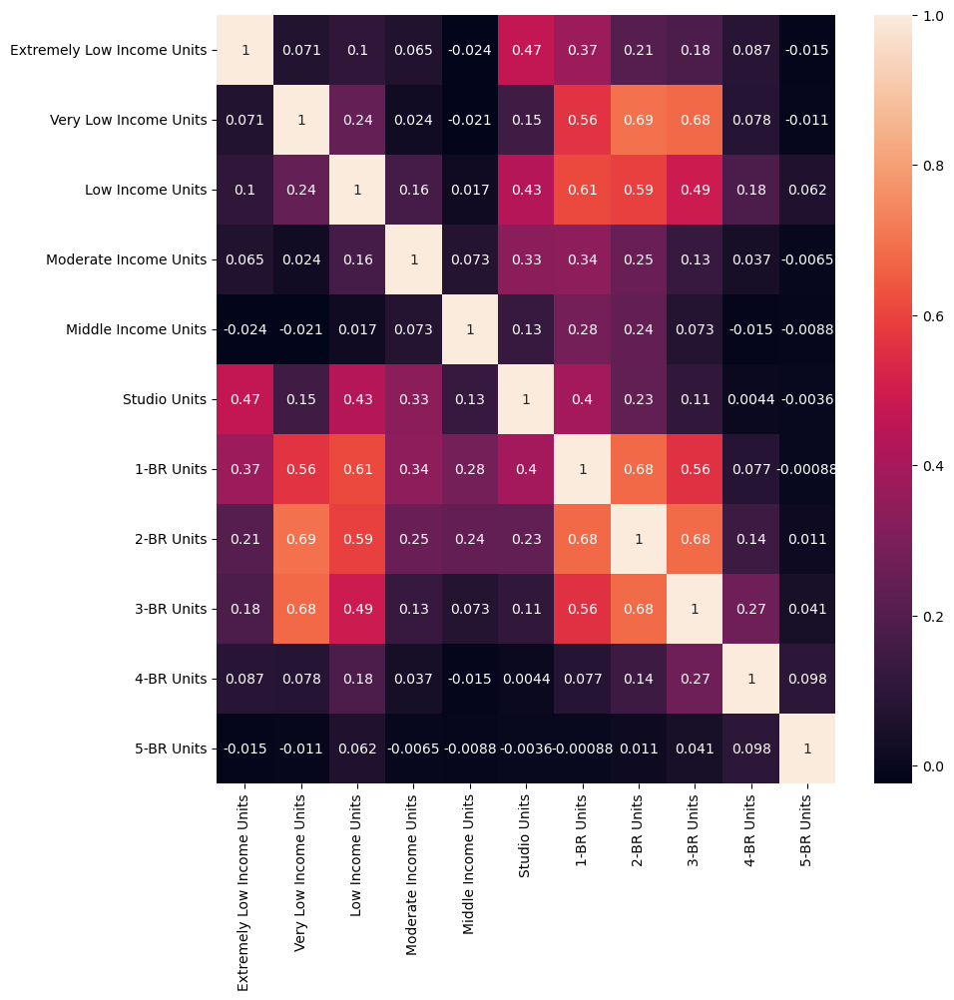

In [28]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(subset2.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

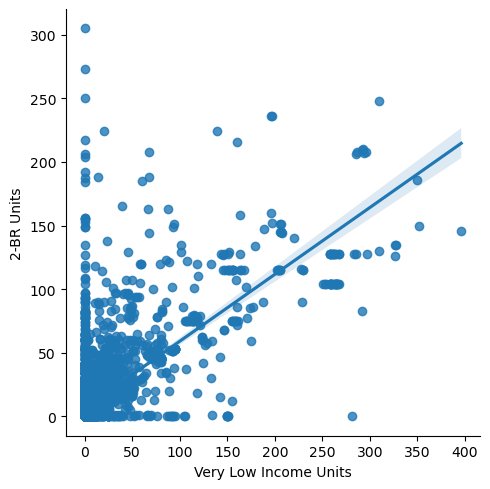

In [48]:
# Create a scatterplot  in seaborn

sns.lmplot(x = 'Very Low Income Units', y = '2-BR Units', data = df)

In [49]:
#We see that there is a fairly strong positive correlation between very low-income units and two-bedroom units

# 4. Pair Plots

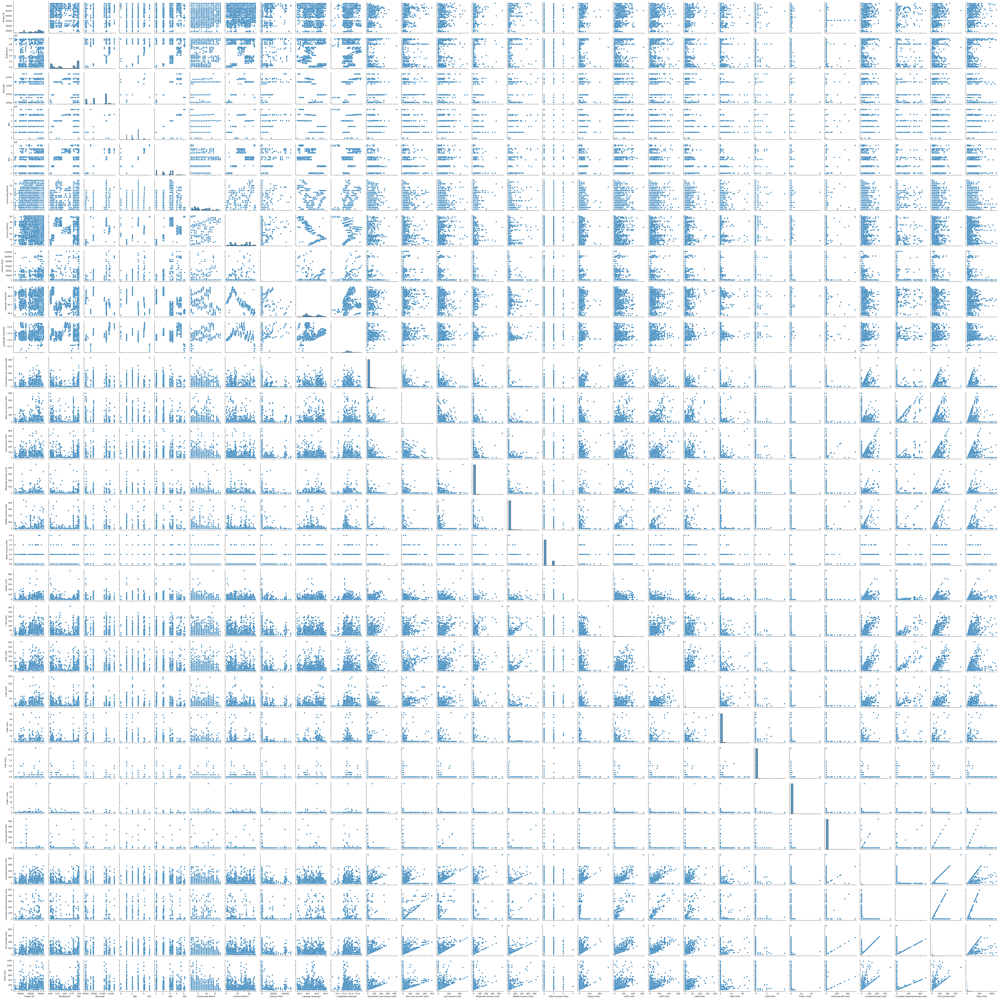

In [50]:
g = sns.pairplot(df)

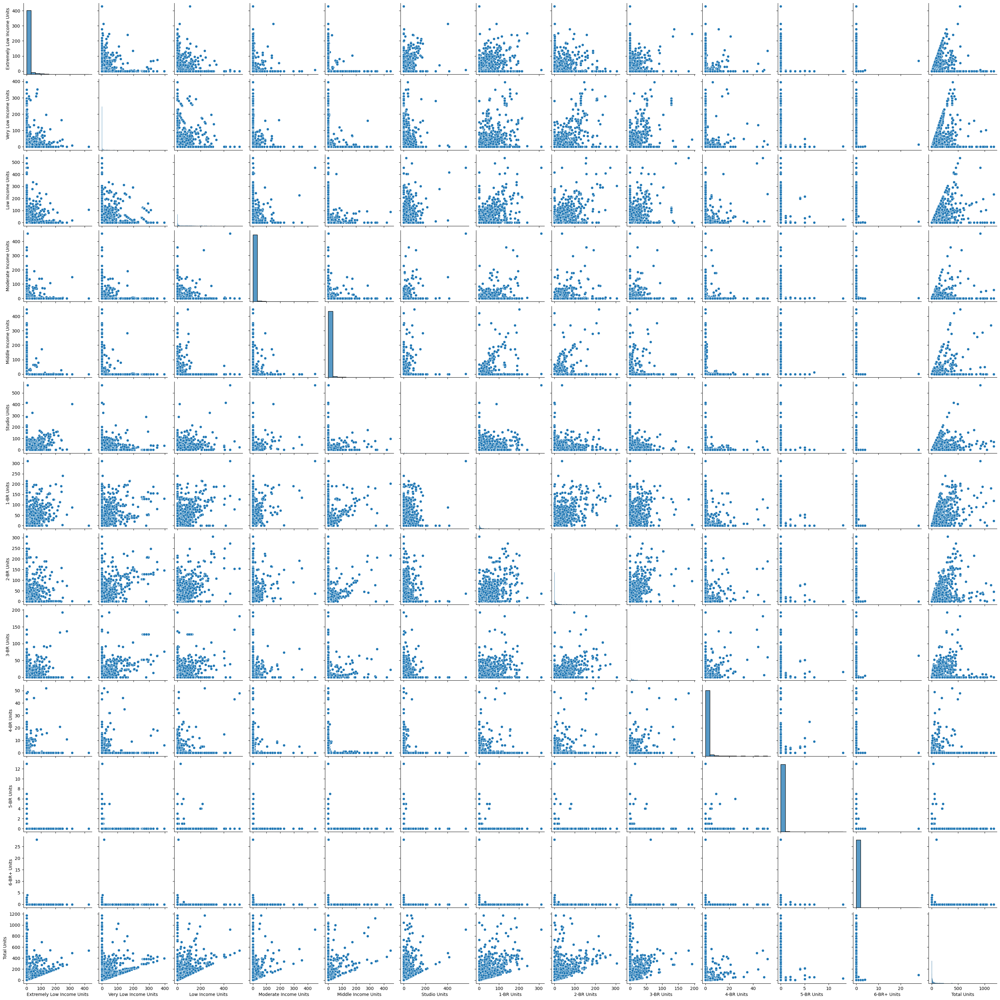

In [51]:
g = sns.pairplot(df_subset)

In [52]:
# Again there is an interesting relationship between 2-BR Unites and lower-income brackets

Categorical Plot

In [32]:
#Creating Categories

df_subset.loc[df_subset['Extremely Low Income Units'], 'Income'] = '0-30% AMI'
df_subset.loc[df_subset['Very Low Income Units'], 'Income'] = '31-50% AMI'
df_subset.loc[df_subset['Low Income Units'], 'Income'] = '51-80% AMI' 
df_subset.loc[df_subset['Moderate Income Units'], 'Income'] = '81-120% AMI'
df_subset.loc[df_subset['Middle Income Units'], 'Income'] = '121-165% AMI'
        


/var/folders/3q/9t272qnj0_xg25cnl9x5c1kw0000gn/T/ipykernel_95805/3034968200.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset.loc[df_subset['Extremely Low Income Units'], 'Income'] = '0-30% AMI'


In [33]:
df_subset['Income'].value_counts(dropna = False)

NaN             5801
121-165% AMI     118
51-80% AMI        88
31-50% AMI        35
81-120% AMI       26
0-30% AMI          7
Name: Income, dtype: int64

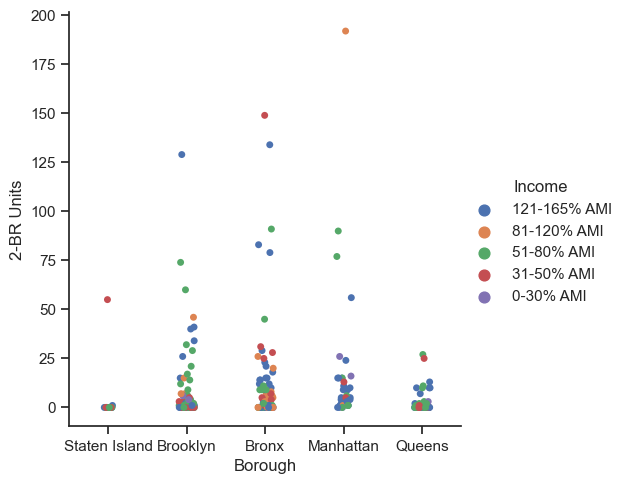

In [37]:
# Creating a categorical plot in seaborn using the income categories created above

sns.set(style="ticks")
g = sns.catplot(x="Borough", y="2-BR Units", hue="Income", data=df_subset)

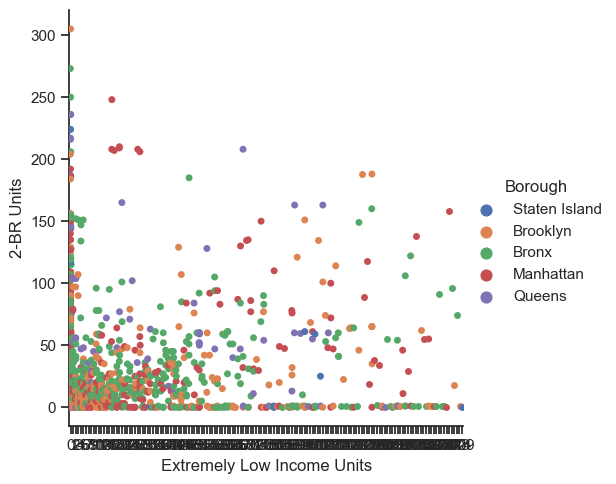

In [43]:
sns.set(style="ticks")
g = sns.catplot(x="Extremely Low Income Units", y="2-BR Units", hue="Borough", data=df_subset)

In [38]:
# fig = g.get_figure()
g.savefig("2BRvsBorough.png") 

# Again, the image will be saved in the working directory. 

In [39]:
# this plot shows us a bit about the amount of 2-BR units in the 5 boroughs and the income bracket to which they are assigned. Immediately, we see that the highest number of units are allocated in Brooklyn and Manhattan to the top two highest AMI rates.   

In [40]:
#We can test this hypothesis about measuring high AMI rates per building per borough in further analysis.